# VAE and GAN Image Generation

In [33]:
#Loading requisite libraries
import keras
from keras import layers
from keras.datasets import mnist
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import imageio
from tqdm import tqdm
import random
from keras import Sequential,Model
from keras.layers import InputLayer,Reshape,Input
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Conv2D,Conv2DTranspose,Conv1D
from keras.layers import GlobalAveragePooling1D
from keras.layers import LeakyReLU
from keras.layers import BatchNormalization,LayerNormalization,MultiHeadAttention
from keras.optimizers import Adam
import pandas as pd
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from keras.utils import np_utils
(train_images, train_labels), (test_images, test_labels) = mnist.load_data()

In [27]:
# scaling the images and combining the training and testing images into 1 dataset
x=np.concatenate([train_images, test_images])
y=np.concatenate([train_labels, test_labels])
x = x.astype("float32") / 255.0
x = np.reshape(x, (-1, 28, 28, 1))
y = keras.utils.to_categorical(y, 10)



images = tf.data.Dataset.from_tensor_slices((x, y))


Building VAE

In [21]:
# creating a sampling layer for the encoder that utilizes the mean and log variance
class Sampling(layers.Layer):
    

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.random.normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


In [22]:
# building CNNVAE encoder
latent_dim = 2

encoder_inputs = Input(shape=(28, 28, 1))
e= Conv2D(32, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
e = Conv2D(64, 3, activation="relu", strides=2, padding="same")(e)
e = Flatten()(e)
e = Dense(16, activation="relu")(e)
z_mean = layers.Dense(latent_dim, name="z_mean")(e)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(e)
z = Sampling()([z_mean, z_log_var])
encoder = Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 28, 28, 1)]  0           []                               
                                                                                                  
 conv2d_6 (Conv2D)              (None, 14, 14, 32)   320         ['input_9[0][0]']                
                                                                                                  
 conv2d_7 (Conv2D)              (None, 7, 7, 64)     18496       ['conv2d_6[0][0]']               
                                                                                                  
 flatten_3 (Flatten)            (None, 3136)         0           ['conv2d_7[0][0]']               
                                                                                            

In [23]:
# Building CNNVAE Decoder
latent_inputs = Input(shape=(latent_dim,))
d = Dense(7 * 7 * 64, activation="relu")(latent_inputs)
d = Reshape((7, 7, 64))(d)
d = Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(d)
d = Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(d)
decoder_outputs = layers.Conv2DTranspose(1, 3, activation="sigmoid", padding="same")(d)
decoder = Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

Model: "decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 2)]               0         
                                                                 
 dense_6 (Dense)             (None, 3136)              9408      
                                                                 
 reshape (Reshape)           (None, 7, 7, 64)          0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 14, 14, 64)       36928     
 nspose)                                                         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 28, 28, 32)       18464     
 ranspose)                                                       
                                                                 
 conv2d_transpose_2 (Conv2DT  (None, 28, 28, 1)        289 

In [24]:
#Building VAE from endoder and decoder as well as defining training function
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super().__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]

    def train_step(self, data):
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data)
            reconstruction = self.decoder(z)
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                    keras.losses.binary_crossentropy(data, reconstruction), axis=(1, 2)
                )
            )
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }

In [28]:
# Building CNN VAE and training model
cnnvae = VAE(encoder, decoder)
cnnvae.compile(optimizer=Adam())
cnnvae.fit(x, epochs=30, batch_size=128)

Epoch 1/30
547/547 [==============================] - 45s 80ms/step - loss: 257.4137 - reconstruction_loss: 209.9260 - kl_loss: 3.1669
Epoch 2/30
547/547 [==============================] - 45s 82ms/step - loss: 189.8781 - reconstruction_loss: 180.3442 - kl_loss: 4.2786
Epoch 3/30
547/547 [==============================] - 43s 78ms/step - loss: 169.4485 - reconstruction_loss: 161.7094 - kl_loss: 5.8026
Epoch 4/30
547/547 [==============================] - 46s 85ms/step - loss: 163.8177 - reconstruction_loss: 156.8141 - kl_loss: 6.0627
Epoch 5/30
547/547 [==============================] - 45s 82ms/step - loss: 160.7336 - reconstruction_loss: 153.7893 - kl_loss: 6.2720
Epoch 6/30
547/547 [==============================] - 43s 79ms/step - loss: 158.9281 - reconstruction_loss: 151.7887 - kl_loss: 6.3928
Epoch 7/30
547/547 [==============================] - 44s 80ms/step - loss: 156.9360 - reconstruction_loss: 150.4135 - kl_loss: 6.4736
Epoch 8/30
547/547 [==============================] - 4

KeyboardInterrupt: 

In [ ]:
# Building FNN VAE Encoder
latent_dim = 2

encoder_inputs = keras.Input(shape=(28, 28,1))
e=Flatten()(encoder_inputs)
e = Dense(512, activation="relu")(e)
z_mean = Dense(latent_dim, name="z_mean")(e)
z_log_var = Dense(latent_dim, name="z_log_var")(e)
z = Sampling()([z_mean, z_log_var])
encoder = Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

In [ ]:
#Building FNN VAE Decoder
latent_inputs = keras.Input(shape=(latent_dim,))
d=Dense(512,activation="relu")(latent_inputs)
outputs = Dense(784, activation="sigmoid")(d)
outputs=layers.Reshape((28,28,1))(outputs)
decoder = keras.Model(latent_inputs, outputs, name="decoder")
decoder.summary()

In [ ]:
# Building and Training FNN VAE
fnnvae=VAE(encoder,decoder)
fnnvae.compile(optimizer=keras.optimizers.Adam())
fnnvae.fit(x, epochs=30, batch_size=128)

Epoch 1/30
547/547 [==============================] - 6s 9ms/step - loss: 230.4025 - reconstruction_loss: 183.2798 - kl_loss: 7.5471
Epoch 2/30
547/547 [==============================] - 5s 10ms/step - loss: 168.6979 - reconstruction_loss: 162.8899 - kl_loss: 4.8677
Epoch 3/30
547/547 [==============================] - 6s 10ms/step - loss: 164.8523 - reconstruction_loss: 159.3417 - kl_loss: 5.0321
Epoch 4/30
547/547 [==============================] - 8s 15ms/step - loss: 162.5254 - reconstruction_loss: 156.5641 - kl_loss: 5.1928
Epoch 5/30
547/547 [==============================] - 9s 16ms/step - loss: 159.7937 - reconstruction_loss: 154.3488 - kl_loss: 5.3380
Epoch 6/30
547/547 [==============================] - 7s 14ms/step - loss: 158.1963 - reconstruction_loss: 152.8243 - kl_loss: 5.4415
Epoch 7/30
547/547 [==============================] - 6s 12ms/step - loss: 157.4802 - reconstruction_loss: 151.6057 - kl_loss: 5.5154
Epoch 8/30
547/547 [==============================] - 6s 11ms/s

In [ ]:
#plotting latent space generated by models
def plot_latent_space(vae, n=30, figsize=15):
    # display an n*n 2D latent space
    digit_size = 28
    scale = 1.0
    figure = np.zeros((digit_size * n, digit_size * n))
    # linearly spaced coordinates of classes in latent space
    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[xi, yi]])
            x_decoded = vae.decoder.predict(z_sample)
            digit = x_decoded[0].reshape(digit_size, digit_size)
            figure[
                i * digit_size : (i + 1) * digit_size,
                j * digit_size : (j + 1) * digit_size,
            ] = digit

    plt.figure(figsize=(figsize, figsize))
    start_range = digit_size // 2
    end_range = n * digit_size + start_range
    pixel_range = np.arange(start_range, end_range, digit_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()




1/1 [==============================] - 0s 29ms/step


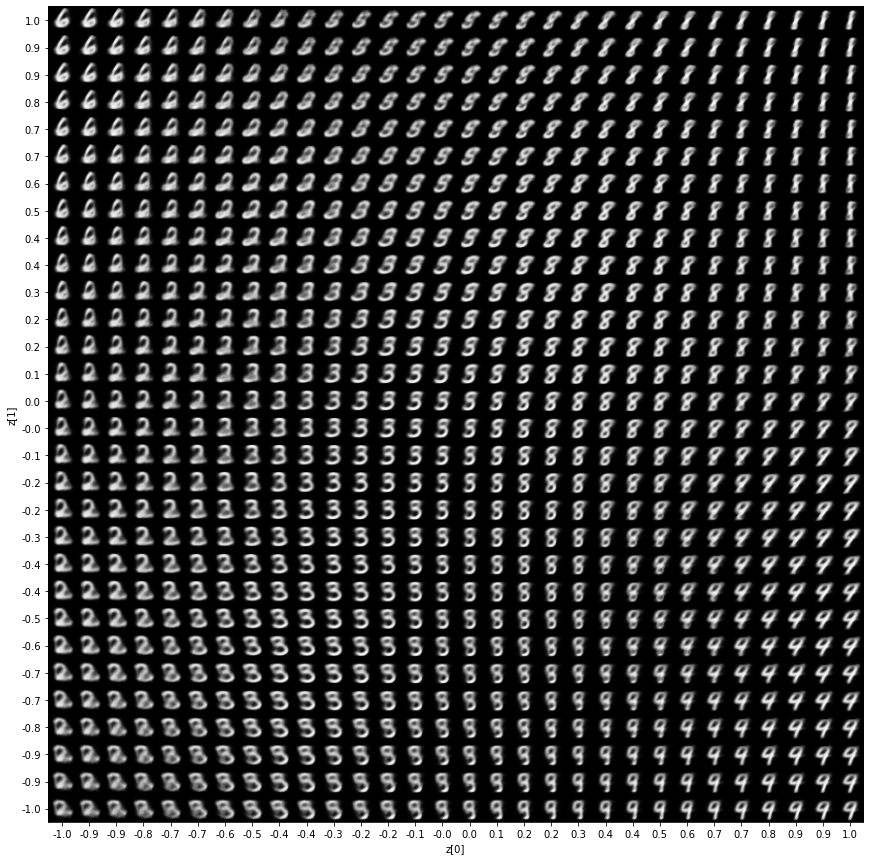

In [ ]:
plot_latent_space(fnnvae)

1/1 [==============================] - 0s 16ms/step


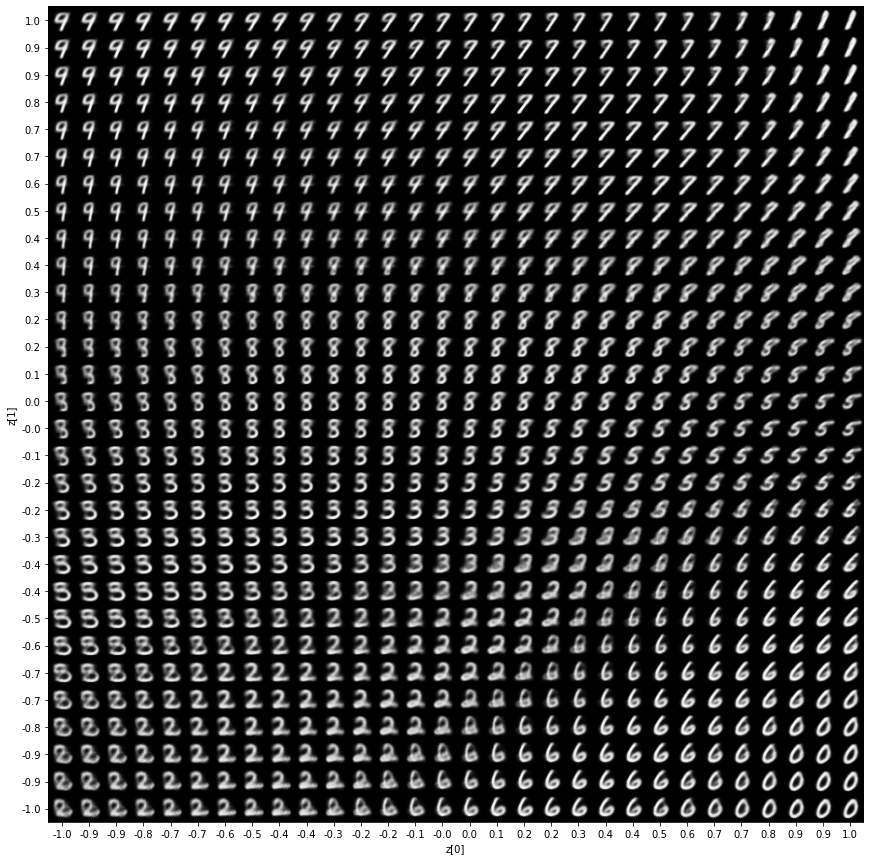

In [ ]:
plot_latent_space(cnnvae)

GAN

In [ ]:
# setting number of generations by generator
gchannels = 100


In [5]:
# creating convolutional discriminator and generator. defining ADAM with different learning rate
adam=Adam(learning_rate=0.0002, beta_1=0.5)
def create_discriminator():
    discriminator= Sequential()
    discriminator.add(InputLayer((28, 28, 1)))
    discriminator.add(Conv2D(56, (5, 5), strides=(2, 2), padding="same"))
    discriminator.add(BatchNormalization())
    discriminator.add(Activation(LeakyReLU(alpha=0.2)))
    discriminator.add(Conv2D(112, (5, 5), strides=(2, 2), padding="same"))
    discriminator.add(BatchNormalization())
    discriminator.add(Activation(LeakyReLU(alpha=0.2)))
    discriminator.add(Conv2D(224, (5, 5), strides=(2, 2), padding="same"))
    discriminator.add(BatchNormalization())
    discriminator.add(Activation(LeakyReLU(alpha=0.2)))
    discriminator.add(Flatten())
    discriminator.add(Dense(1,activation='sigmoid'))
    discriminator.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])


    discriminator.trainable = False
    return discriminator
discriminator= create_discriminator()
discriminator.summary()
def create_generator():
    generator= Sequential()
    generator.add(InputLayer((gchannels,)))
    generator.add(Dense(7 * 7 * 112)) # to ensure reshaping
    generator.add(Reshape((7, 7, 112)))
    generator.add(BatchNormalization())
    generator.add(Activation(LeakyReLU(alpha=0.2)))
    generator.add(Conv2DTranspose(56, (5, 5), strides=(2, 2), padding="same"))
    generator.add(BatchNormalization())
    generator.add(Activation(LeakyReLU(alpha=0.2)))
    generator.add(Conv2DTranspose(1, (5, 5), strides=(2, 2), padding="same", activation = 'tanh'))

    generator.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    return generator
generator=create_generator()
generator.summary()




Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 14, 14, 56)        1456      
                                                                 
 batch_normalization (Batch  (None, 14, 14, 56)        224       
 Normalization)                                                  
                                                                 
 activation (Activation)     (None, 14, 14, 56)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 7, 7, 112)         156912    
                                                                 
 batch_normalization_1 (Bat  (None, 7, 7, 112)         448       
 chNormalization)                                                
                                                                 
 activation_1 (Activation)   (None, 7, 7, 112)         0

In [6]:
#method to create GAN with generator and discriminator
def create_gan(discriminator, generator):
    discriminator.trainable=False
    gan_input = Input(shape=(gchannels,))
    z = generator(gan_input)
    gan_output= discriminator(z)
    gan= Model(inputs=gan_input, outputs=gan_output)
    gan.compile(loss='binary_crossentropy', optimizer='adam')
    return gan


In [7]:
gan=create_gan(discriminator,generator)

In [8]:
# function to plot generated images

def plot_generated(n_ex=10, dim=(1, 10), figsize=(12, 2)):
    noise = np.random.normal(0, 1, size=(n_ex, 100))
    generated_images = generator.predict(noise)
    generated_images = generated_images.reshape(n_ex, 28, 28)

    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i], interpolation='nearest', cmap='gray_r')
        plt.axis('off')
    plt.tight_layout()
    plt.show()


In [9]:
def train(epochs=1, plt_frq=1, BATCH_SIZE=128):
    batchCount = int(x.shape[0] / BATCH_SIZE)
    print('Epochs:', epochs)
    print('Batch size:', BATCH_SIZE)
    print('Batches per epoch:', batchCount)

    for e in tqdm(range(1, epochs+1)):
        if e == 1 or e%plt_frq == 0:
            print('-'*15, 'Epoch %d' % e, '-'*15)
        for _ in range(batchCount): 
            # Create a batch by drawing random numbers from the training set
            image_batch = x[np.random.randint(0, x.shape[0], size=BATCH_SIZE)]
            # Creating noise for generator
            noise = np.random.normal(0, 1, size=(BATCH_SIZE, 100))

            # Generate images
            generated_images = generator.predict(noise)
            X = np.concatenate((image_batch, generated_images))
            # labeling
            y = np.zeros(2*BATCH_SIZE)
            y[:BATCH_SIZE] = 0.9  # One-sided label smoothing

            # Train discriminator
            discriminator.trainable = True
            d_loss = discriminator.train_on_batch(X, y)

            # Train generator
            noise = np.random.normal(0, 1, size=(BATCH_SIZE, 100))
            y2 = np.ones(BATCH_SIZE)
            discriminator.trainable = False
            g_loss = gan.train_on_batch(noise, y2)




        # Update the plots
        if e == 1 or e%plt_frq == 0:
            plot_generated()


Epochs: 200
Batch size: 128
Batches per epoch: 546


  0%|          | 0/200 [00:00<?, ?it/s]

--------------- Epoch 1 ---------------
1/1 [==============================] - 0s 104ms/step


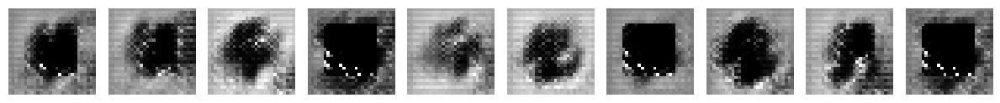

  0%|          | 1/200 [00:59<3:18:55, 59.98s/it]

4/4 [==============================] - 0s 2ms/step


  1%|          | 2/200 [01:45<2:48:53, 51.18s/it]

4/4 [==============================] - 0s 2ms/step


  2%|▏         | 3/200 [02:29<2:38:23, 48.24s/it]

4/4 [==============================] - 0s 2ms/step


  2%|▏         | 4/200 [03:15<2:34:22, 47.26s/it]

4/4 [==============================] - 0s 2ms/step


  2%|▎         | 5/200 [04:00<2:30:24, 46.28s/it]

4/4 [==============================] - 0s 2ms/step


  3%|▎         | 6/200 [04:45<2:29:06, 46.11s/it]

4/4 [==============================] - 0s 2ms/step


  4%|▎         | 7/200 [05:30<2:26:50, 45.65s/it]

4/4 [==============================] - 0s 3ms/step


  4%|▍         | 8/200 [06:16<2:26:21, 45.74s/it]

4/4 [==============================] - 0s 2ms/step


  4%|▍         | 9/200 [07:01<2:24:51, 45.51s/it]

4/4 [==============================] - 0s 2ms/step


  5%|▌         | 10/200 [07:48<2:25:08, 45.84s/it]

4/4 [==============================] - 0s 2ms/step


  6%|▌         | 11/200 [08:33<2:24:05, 45.74s/it]

4/4 [==============================] - 0s 2ms/step


  6%|▌         | 12/200 [09:19<2:23:47, 45.89s/it]

4/4 [==============================] - 0s 2ms/step


  6%|▋         | 13/200 [10:05<2:22:23, 45.69s/it]

4/4 [==============================] - 0s 2ms/step


  7%|▋         | 14/200 [10:51<2:22:16, 45.90s/it]

4/4 [==============================] - 0s 3ms/step


  8%|▊         | 15/200 [11:36<2:20:56, 45.71s/it]

4/4 [==============================] - 0s 2ms/step


  8%|▊         | 16/200 [12:22<2:20:44, 45.89s/it]

4/4 [==============================] - 0s 2ms/step


  8%|▊         | 17/200 [13:08<2:19:35, 45.77s/it]

4/4 [==============================] - 0s 2ms/step


  9%|▉         | 18/200 [13:54<2:19:19, 45.93s/it]

4/4 [==============================] - 0s 2ms/step


 10%|▉         | 19/200 [14:40<2:18:14, 45.82s/it]

--------------- Epoch 20 ---------------
1/1 [==============================] - 0s 19ms/step


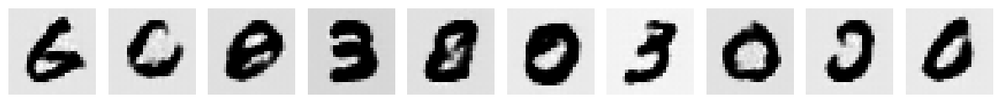

 10%|█         | 20/200 [15:26<2:17:50, 45.95s/it]

4/4 [==============================] - 0s 2ms/step


 10%|█         | 21/200 [16:12<2:17:17, 46.02s/it]

4/4 [==============================] - 0s 2ms/step


 11%|█         | 22/200 [16:57<2:15:46, 45.77s/it]

4/4 [==============================] - 0s 2ms/step


 12%|█▏        | 23/200 [17:44<2:15:26, 45.91s/it]

4/4 [==============================] - 0s 2ms/step


 12%|█▏        | 24/200 [18:29<2:14:16, 45.77s/it]

4/4 [==============================] - 0s 2ms/step


 12%|█▎        | 25/200 [19:16<2:14:20, 46.06s/it]

4/4 [==============================] - 0s 2ms/step


 13%|█▎        | 26/200 [20:01<2:13:08, 45.91s/it]

4/4 [==============================] - 0s 3ms/step


 14%|█▎        | 27/200 [20:48<2:13:16, 46.22s/it]

4/4 [==============================] - 0s 2ms/step


 14%|█▍        | 28/200 [21:34<2:12:00, 46.05s/it]

4/4 [==============================] - 0s 3ms/step


 14%|█▍        | 29/200 [22:20<2:11:26, 46.12s/it]

4/4 [==============================] - 0s 2ms/step


 15%|█▌        | 30/200 [23:06<2:10:15, 45.97s/it]

4/4 [==============================] - 0s 2ms/step


 16%|█▌        | 31/200 [23:53<2:10:01, 46.16s/it]

4/4 [==============================] - 0s 3ms/step


 16%|█▌        | 32/200 [24:38<2:08:50, 46.01s/it]

4/4 [==============================] - 0s 2ms/step


 16%|█▋        | 33/200 [25:25<2:08:35, 46.20s/it]

4/4 [==============================] - 0s 2ms/step


 17%|█▋        | 34/200 [26:11<2:08:06, 46.30s/it]

4/4 [==============================] - 0s 2ms/step


 18%|█▊        | 35/200 [26:57<2:06:58, 46.17s/it]

4/4 [==============================] - 0s 2ms/step


 18%|█▊        | 36/200 [27:44<2:06:22, 46.23s/it]

4/4 [==============================] - 0s 2ms/step


 18%|█▊        | 37/200 [28:29<2:04:48, 45.94s/it]

4/4 [==============================] - 0s 2ms/step


 19%|█▉        | 38/200 [29:15<2:04:32, 46.13s/it]

4/4 [==============================] - 0s 2ms/step


 20%|█▉        | 39/200 [30:01<2:03:03, 45.86s/it]

--------------- Epoch 40 ---------------
1/1 [==============================] - 0s 17ms/step


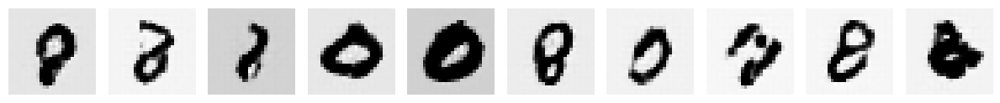

 20%|██        | 40/200 [30:47<2:02:48, 46.05s/it]

4/4 [==============================] - 0s 2ms/step


 20%|██        | 41/200 [31:33<2:01:36, 45.89s/it]

4/4 [==============================] - 0s 2ms/step


 21%|██        | 42/200 [32:19<2:01:12, 46.03s/it]

4/4 [==============================] - 0s 2ms/step


 22%|██▏       | 43/200 [33:04<1:59:51, 45.81s/it]

4/4 [==============================] - 0s 2ms/step


 22%|██▏       | 44/200 [33:51<1:59:35, 46.00s/it]

4/4 [==============================] - 0s 2ms/step


 22%|██▎       | 45/200 [34:37<1:58:49, 46.00s/it]

4/4 [==============================] - 0s 2ms/step


 23%|██▎       | 46/200 [35:24<1:58:40, 46.24s/it]

4/4 [==============================] - 0s 2ms/step


 24%|██▎       | 47/200 [36:10<1:57:40, 46.15s/it]

4/4 [==============================] - 0s 2ms/step


 24%|██▍       | 48/200 [36:55<1:56:24, 45.95s/it]

4/4 [==============================] - 0s 2ms/step


 24%|██▍       | 49/200 [37:42<1:56:08, 46.15s/it]

4/4 [==============================] - 0s 2ms/step


 25%|██▌       | 50/200 [38:27<1:54:46, 45.91s/it]

4/4 [==============================] - 0s 2ms/step


 26%|██▌       | 51/200 [39:14<1:54:29, 46.10s/it]

4/4 [==============================] - 0s 2ms/step


 26%|██▌       | 52/200 [39:59<1:53:23, 45.97s/it]

4/4 [==============================] - 0s 3ms/step


 26%|██▋       | 53/200 [40:46<1:53:06, 46.17s/it]

4/4 [==============================] - 0s 3ms/step


 27%|██▋       | 54/200 [41:31<1:51:57, 46.01s/it]

4/4 [==============================] - 0s 2ms/step


 28%|██▊       | 55/200 [42:18<1:51:41, 46.21s/it]

4/4 [==============================] - 0s 2ms/step


 28%|██▊       | 56/200 [43:04<1:50:27, 46.02s/it]

4/4 [==============================] - 0s 2ms/step


 28%|██▊       | 57/200 [43:50<1:50:08, 46.22s/it]

4/4 [==============================] - 0s 3ms/step


 29%|██▉       | 58/200 [44:36<1:48:56, 46.03s/it]

4/4 [==============================] - 0s 2ms/step


 30%|██▉       | 59/200 [45:23<1:48:34, 46.20s/it]

--------------- Epoch 60 ---------------
1/1 [==============================] - 0s 17ms/step


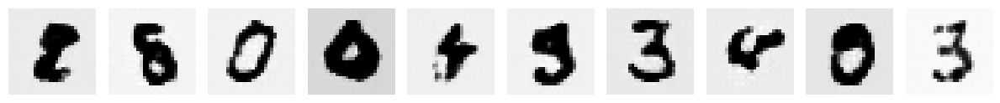

 30%|███       | 60/200 [46:09<1:47:36, 46.12s/it]

4/4 [==============================] - 0s 2ms/step


 30%|███       | 61/200 [46:55<1:46:58, 46.18s/it]

4/4 [==============================] - 0s 3ms/step


 31%|███       | 62/200 [47:42<1:46:46, 46.42s/it]

4/4 [==============================] - 0s 3ms/step


 32%|███▏      | 63/200 [48:28<1:46:06, 46.47s/it]

4/4 [==============================] - 0s 2ms/step


 32%|███▏      | 64/200 [49:16<1:46:04, 46.80s/it]

4/4 [==============================] - 0s 2ms/step


 32%|███▎      | 65/200 [50:02<1:44:59, 46.66s/it]

4/4 [==============================] - 0s 2ms/step


 33%|███▎      | 66/200 [50:49<1:44:24, 46.75s/it]

4/4 [==============================] - 0s 2ms/step


 34%|███▎      | 67/200 [51:35<1:43:01, 46.48s/it]

4/4 [==============================] - 0s 2ms/step


 34%|███▍      | 68/200 [52:22<1:42:34, 46.62s/it]

4/4 [==============================] - 0s 2ms/step


 34%|███▍      | 69/200 [53:08<1:41:29, 46.48s/it]

4/4 [==============================] - 0s 2ms/step


 35%|███▌      | 70/200 [53:55<1:40:55, 46.58s/it]

4/4 [==============================] - 0s 2ms/step


 36%|███▌      | 71/200 [54:41<1:39:44, 46.39s/it]

4/4 [==============================] - 0s 2ms/step


 36%|███▌      | 72/200 [55:28<1:39:40, 46.72s/it]

4/4 [==============================] - 0s 2ms/step


 36%|███▋      | 73/200 [56:15<1:38:33, 46.56s/it]

4/4 [==============================] - 0s 3ms/step


 37%|███▋      | 74/200 [57:02<1:38:08, 46.73s/it]

4/4 [==============================] - 0s 2ms/step


 38%|███▊      | 75/200 [57:48<1:36:47, 46.46s/it]

4/4 [==============================] - 0s 2ms/step


 38%|███▊      | 76/200 [58:34<1:36:14, 46.57s/it]

4/4 [==============================] - 0s 2ms/step


 38%|███▊      | 77/200 [59:20<1:35:05, 46.39s/it]

4/4 [==============================] - 0s 2ms/step


 39%|███▉      | 78/200 [1:00:08<1:34:59, 46.72s/it]

4/4 [==============================] - 0s 2ms/step


 40%|███▉      | 79/200 [1:00:54<1:33:48, 46.51s/it]

--------------- Epoch 80 ---------------
1/1 [==============================] - 0s 19ms/step


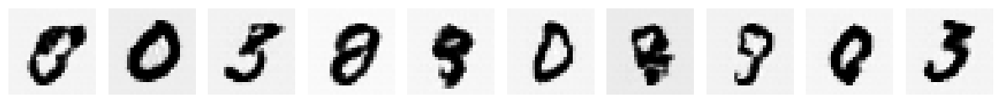

 40%|████      | 80/200 [1:01:41<1:33:32, 46.77s/it]

4/4 [==============================] - 0s 3ms/step


 40%|████      | 81/200 [1:02:28<1:32:42, 46.74s/it]

4/4 [==============================] - 0s 2ms/step


 41%|████      | 82/200 [1:03:14<1:31:26, 46.49s/it]

4/4 [==============================] - 0s 2ms/step


 42%|████▏     | 83/200 [1:04:01<1:31:13, 46.79s/it]

4/4 [==============================] - 0s 2ms/step


 42%|████▏     | 84/200 [1:04:48<1:30:07, 46.62s/it]

4/4 [==============================] - 0s 3ms/step


 42%|████▎     | 85/200 [1:05:35<1:29:44, 46.82s/it]

4/4 [==============================] - 0s 2ms/step


 43%|████▎     | 86/200 [1:06:21<1:28:21, 46.51s/it]

4/4 [==============================] - 0s 2ms/step


 44%|████▎     | 87/200 [1:07:08<1:27:51, 46.65s/it]

4/4 [==============================] - 0s 2ms/step


 44%|████▍     | 88/200 [1:07:54<1:26:39, 46.42s/it]

4/4 [==============================] - 0s 2ms/step


 44%|████▍     | 89/200 [1:08:40<1:26:03, 46.52s/it]

4/4 [==============================] - 0s 2ms/step


 45%|████▌     | 90/200 [1:09:26<1:24:47, 46.25s/it]

4/4 [==============================] - 0s 2ms/step


 46%|████▌     | 91/200 [1:10:13<1:24:33, 46.55s/it]

4/4 [==============================] - 0s 2ms/step


 46%|████▌     | 92/200 [1:10:59<1:23:24, 46.34s/it]

4/4 [==============================] - 0s 2ms/step


 46%|████▋     | 93/200 [1:11:46<1:22:50, 46.45s/it]

4/4 [==============================] - 0s 3ms/step


 47%|████▋     | 94/200 [1:12:31<1:21:31, 46.15s/it]

4/4 [==============================] - 0s 2ms/step


 48%|████▊     | 95/200 [1:13:18<1:21:12, 46.40s/it]

4/4 [==============================] - 0s 2ms/step


 48%|████▊     | 96/200 [1:14:04<1:20:14, 46.29s/it]

4/4 [==============================] - 0s 3ms/step


 48%|████▊     | 97/200 [1:14:51<1:19:51, 46.52s/it]

4/4 [==============================] - 0s 2ms/step


 49%|████▉     | 98/200 [1:15:37<1:18:48, 46.36s/it]

4/4 [==============================] - 0s 2ms/step


 50%|████▉     | 99/200 [1:16:25<1:18:43, 46.77s/it]

--------------- Epoch 100 ---------------
1/1 [==============================] - 0s 19ms/step


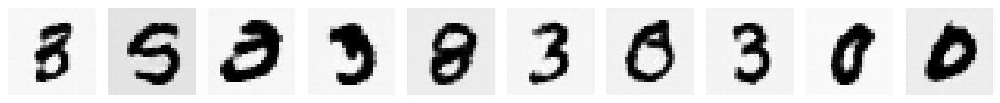

 50%|█████     | 100/200 [1:17:12<1:18:08, 46.89s/it]

4/4 [==============================] - 0s 3ms/step


 50%|█████     | 101/200 [1:17:59<1:17:18, 46.86s/it]

4/4 [==============================] - 0s 2ms/step


 51%|█████     | 102/200 [1:18:46<1:16:39, 46.93s/it]

4/4 [==============================] - 0s 2ms/step


 52%|█████▏    | 103/200 [1:19:32<1:15:25, 46.65s/it]

4/4 [==============================] - 0s 2ms/step


 52%|█████▏    | 104/200 [1:20:19<1:14:52, 46.79s/it]

4/4 [==============================] - 0s 2ms/step


 52%|█████▎    | 105/200 [1:21:06<1:13:57, 46.71s/it]

4/4 [==============================] - 0s 2ms/step


 53%|█████▎    | 106/200 [1:21:53<1:13:28, 46.90s/it]

4/4 [==============================] - 0s 2ms/step


 54%|█████▎    | 107/200 [1:22:39<1:12:24, 46.72s/it]

4/4 [==============================] - 0s 2ms/step


 54%|█████▍    | 108/200 [1:23:27<1:12:01, 46.97s/it]

4/4 [==============================] - 0s 2ms/step


 55%|█████▍    | 109/200 [1:24:13<1:11:04, 46.87s/it]

4/4 [==============================] - 0s 2ms/step


 55%|█████▌    | 110/200 [1:25:01<1:10:23, 46.93s/it]

4/4 [==============================] - 0s 2ms/step


 56%|█████▌    | 111/200 [1:25:47<1:09:16, 46.71s/it]

4/4 [==============================] - 0s 2ms/step


 56%|█████▌    | 112/200 [1:26:35<1:09:12, 47.18s/it]

4/4 [==============================] - 0s 2ms/step


 56%|█████▋    | 113/200 [1:27:22<1:08:09, 47.00s/it]

4/4 [==============================] - 0s 2ms/step


 57%|█████▋    | 114/200 [1:28:09<1:07:32, 47.13s/it]

4/4 [==============================] - 0s 2ms/step


 57%|█████▊    | 115/200 [1:28:56<1:06:29, 46.94s/it]

4/4 [==============================] - 0s 3ms/step


 58%|█████▊    | 116/200 [1:29:43<1:06:02, 47.17s/it]

4/4 [==============================] - 0s 2ms/step


 58%|█████▊    | 117/200 [1:30:30<1:05:12, 47.14s/it]

4/4 [==============================] - 0s 2ms/step


 59%|█████▉    | 118/200 [1:31:19<1:05:02, 47.59s/it]

4/4 [==============================] - 0s 2ms/step


 60%|█████▉    | 119/200 [1:32:06<1:04:08, 47.52s/it]

--------------- Epoch 120 ---------------
1/1 [==============================] - 0s 18ms/step


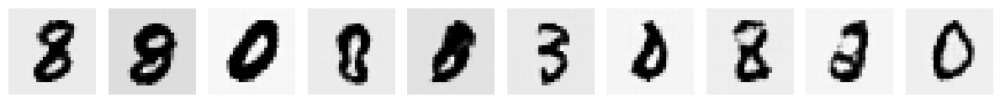

 60%|██████    | 120/200 [1:32:55<1:03:40, 47.76s/it]

4/4 [==============================] - 0s 2ms/step


 60%|██████    | 121/200 [1:33:43<1:03:01, 47.87s/it]

4/4 [==============================] - 0s 2ms/step


 61%|██████    | 122/200 [1:34:29<1:01:47, 47.53s/it]

4/4 [==============================] - 0s 2ms/step


 62%|██████▏   | 123/200 [1:35:17<1:01:00, 47.54s/it]

4/4 [==============================] - 0s 2ms/step


 62%|██████▏   | 124/200 [1:36:03<59:46, 47.19s/it]  

4/4 [==============================] - 0s 2ms/step


 62%|██████▎   | 125/200 [1:36:51<59:00, 47.21s/it]

4/4 [==============================] - 0s 2ms/step


 63%|██████▎   | 126/200 [1:37:37<57:48, 46.87s/it]

4/4 [==============================] - 0s 2ms/step


 64%|██████▎   | 127/200 [1:38:24<57:16, 47.07s/it]

4/4 [==============================] - 0s 2ms/step


 64%|██████▍   | 128/200 [1:39:11<56:14, 46.86s/it]

4/4 [==============================] - 0s 2ms/step


 64%|██████▍   | 129/200 [1:39:58<55:28, 46.88s/it]

4/4 [==============================] - 0s 2ms/step


 65%|██████▌   | 130/200 [1:40:44<54:31, 46.74s/it]

4/4 [==============================] - 0s 2ms/step


 66%|██████▌   | 131/200 [1:41:32<54:16, 47.20s/it]

4/4 [==============================] - 0s 2ms/step


 66%|██████▌   | 132/200 [1:42:19<53:20, 47.07s/it]

4/4 [==============================] - 0s 2ms/step


 66%|██████▋   | 133/200 [1:43:07<52:47, 47.27s/it]

4/4 [==============================] - 0s 2ms/step


 67%|██████▋   | 134/200 [1:43:54<51:55, 47.21s/it]

4/4 [==============================] - 0s 2ms/step


 68%|██████▊   | 135/200 [1:44:43<51:38, 47.67s/it]

4/4 [==============================] - 0s 2ms/step


 68%|██████▊   | 136/200 [1:45:30<50:51, 47.68s/it]

4/4 [==============================] - 0s 2ms/step


 68%|██████▊   | 137/200 [1:46:20<50:34, 48.17s/it]

4/4 [==============================] - 0s 2ms/step


 69%|██████▉   | 138/200 [1:47:07<49:36, 48.00s/it]

4/4 [==============================] - 0s 2ms/step


 70%|██████▉   | 139/200 [1:47:55<48:51, 48.05s/it]

--------------- Epoch 140 ---------------
1/1 [==============================] - 0s 18ms/step


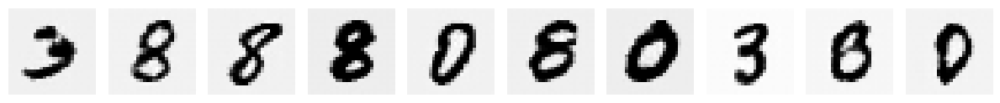

 70%|███████   | 140/200 [1:48:43<47:50, 47.85s/it]

4/4 [==============================] - 0s 2ms/step


 70%|███████   | 141/200 [1:49:30<46:53, 47.69s/it]

4/4 [==============================] - 0s 3ms/step


 71%|███████   | 142/200 [1:50:17<45:56, 47.52s/it]

4/4 [==============================] - 0s 2ms/step


 72%|███████▏  | 143/200 [1:51:03<44:44, 47.10s/it]

4/4 [==============================] - 0s 2ms/step


 72%|███████▏  | 144/200 [1:51:51<44:00, 47.15s/it]

4/4 [==============================] - 0s 2ms/step


 72%|███████▎  | 145/200 [1:52:36<42:51, 46.75s/it]

4/4 [==============================] - 0s 2ms/step


 73%|███████▎  | 146/200 [1:53:24<42:10, 46.86s/it]

4/4 [==============================] - 0s 2ms/step


 74%|███████▎  | 147/200 [1:54:09<41:05, 46.52s/it]

4/4 [==============================] - 0s 2ms/step


 74%|███████▍  | 148/200 [1:54:56<40:24, 46.62s/it]

4/4 [==============================] - 0s 2ms/step


 74%|███████▍  | 149/200 [1:55:42<39:25, 46.38s/it]

4/4 [==============================] - 0s 3ms/step


 75%|███████▌  | 150/200 [1:56:29<38:49, 46.58s/it]

4/4 [==============================] - 0s 2ms/step


 76%|███████▌  | 151/200 [1:57:15<37:57, 46.48s/it]

4/4 [==============================] - 0s 2ms/step


 76%|███████▌  | 152/200 [1:58:02<37:19, 46.66s/it]

4/4 [==============================] - 0s 2ms/step


 76%|███████▋  | 153/200 [1:58:49<36:26, 46.53s/it]

4/4 [==============================] - 0s 2ms/step


 77%|███████▋  | 154/200 [1:59:36<35:49, 46.74s/it]

4/4 [==============================] - 0s 2ms/step


 78%|███████▊  | 155/200 [2:00:22<34:59, 46.66s/it]

4/4 [==============================] - 0s 2ms/step


 78%|███████▊  | 156/200 [2:01:10<34:22, 46.87s/it]

4/4 [==============================] - 0s 2ms/step


 78%|███████▊  | 157/200 [2:01:56<33:23, 46.59s/it]

4/4 [==============================] - 0s 2ms/step


 79%|███████▉  | 158/200 [2:02:43<32:48, 46.87s/it]

4/4 [==============================] - 0s 2ms/step


 80%|███████▉  | 159/200 [2:03:29<31:55, 46.72s/it]

--------------- Epoch 160 ---------------
1/1 [==============================] - 0s 19ms/step


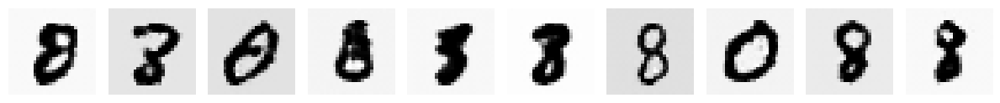

 80%|████████  | 160/200 [2:04:17<31:24, 47.10s/it]

4/4 [==============================] - 0s 2ms/step


 80%|████████  | 161/200 [2:05:05<30:39, 47.17s/it]

4/4 [==============================] - 0s 2ms/step


 81%|████████  | 162/200 [2:05:51<29:42, 46.91s/it]

4/4 [==============================] - 0s 2ms/step


 82%|████████▏ | 163/200 [2:06:38<29:00, 47.04s/it]

4/4 [==============================] - 0s 2ms/step


 82%|████████▏ | 164/200 [2:07:25<28:07, 46.86s/it]

4/4 [==============================] - 0s 2ms/step


 82%|████████▎ | 165/200 [2:08:13<27:28, 47.11s/it]

4/4 [==============================] - 0s 2ms/step


 83%|████████▎ | 166/200 [2:08:59<26:33, 46.88s/it]

4/4 [==============================] - 0s 2ms/step


 84%|████████▎ | 167/200 [2:09:46<25:54, 47.10s/it]

4/4 [==============================] - 0s 2ms/step


 84%|████████▍ | 168/200 [2:10:33<25:02, 46.96s/it]

4/4 [==============================] - 0s 3ms/step


 84%|████████▍ | 169/200 [2:11:21<24:25, 47.27s/it]

4/4 [==============================] - 0s 2ms/step


 85%|████████▌ | 170/200 [2:12:08<23:31, 47.06s/it]

4/4 [==============================] - 0s 2ms/step


 86%|████████▌ | 171/200 [2:12:56<22:53, 47.38s/it]

4/4 [==============================] - 0s 2ms/step


 86%|████████▌ | 172/200 [2:13:43<22:02, 47.24s/it]

4/4 [==============================] - 0s 2ms/step


 86%|████████▋ | 173/200 [2:14:31<21:25, 47.60s/it]

4/4 [==============================] - 0s 2ms/step


 87%|████████▋ | 174/200 [2:15:18<20:34, 47.47s/it]

4/4 [==============================] - 0s 2ms/step


 88%|████████▊ | 175/200 [2:16:07<19:53, 47.72s/it]

4/4 [==============================] - 0s 2ms/step


 88%|████████▊ | 176/200 [2:16:53<18:55, 47.30s/it]

4/4 [==============================] - 0s 2ms/step


 88%|████████▊ | 177/200 [2:17:41<18:11, 47.46s/it]

4/4 [==============================] - 0s 2ms/step


 89%|████████▉ | 178/200 [2:18:28<17:21, 47.34s/it]

4/4 [==============================] - 0s 3ms/step


 90%|████████▉ | 179/200 [2:19:16<16:38, 47.54s/it]

--------------- Epoch 180 ---------------
1/1 [==============================] - 0s 21ms/step


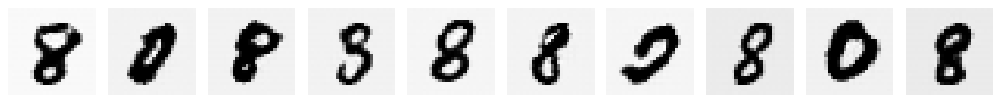

 90%|█████████ | 180/200 [2:20:04<15:52, 47.61s/it]

4/4 [==============================] - 0s 2ms/step


 90%|█████████ | 181/200 [2:20:52<15:07, 47.75s/it]

4/4 [==============================] - 0s 2ms/step


 91%|█████████ | 182/200 [2:21:42<14:30, 48.38s/it]

4/4 [==============================] - 0s 3ms/step


 92%|█████████▏| 183/200 [2:22:31<13:45, 48.57s/it]

4/4 [==============================] - 0s 3ms/step


 92%|█████████▏| 184/200 [2:23:22<13:11, 49.49s/it]

4/4 [==============================] - 0s 2ms/step


 92%|█████████▎| 185/200 [2:24:11<12:19, 49.30s/it]

4/4 [==============================] - 0s 2ms/step


 93%|█████████▎| 186/200 [2:25:01<11:32, 49.44s/it]

4/4 [==============================] - 0s 2ms/step


 94%|█████████▎| 187/200 [2:25:50<10:41, 49.32s/it]

4/4 [==============================] - 0s 3ms/step


 94%|█████████▍| 188/200 [2:26:39<09:52, 49.40s/it]

4/4 [==============================] - 0s 2ms/step


 94%|█████████▍| 189/200 [2:27:28<09:00, 49.09s/it]

4/4 [==============================] - 0s 3ms/step


 95%|█████████▌| 190/200 [2:28:17<08:12, 49.24s/it]

4/4 [==============================] - 0s 2ms/step


 96%|█████████▌| 191/200 [2:29:06<07:20, 48.91s/it]

4/4 [==============================] - 0s 2ms/step


 96%|█████████▌| 192/200 [2:29:55<06:31, 48.95s/it]

4/4 [==============================] - 0s 2ms/step


 96%|█████████▋| 193/200 [2:30:42<05:40, 48.60s/it]

4/4 [==============================] - 0s 5ms/step


 97%|█████████▋| 194/200 [2:31:32<04:52, 48.79s/it]

4/4 [==============================] - 0s 2ms/step


 98%|█████████▊| 195/200 [2:32:19<04:02, 48.50s/it]

4/4 [==============================] - 0s 2ms/step


 98%|█████████▊| 196/200 [2:33:08<03:14, 48.62s/it]

4/4 [==============================] - 0s 3ms/step


 98%|█████████▊| 197/200 [2:33:56<02:24, 48.33s/it]

4/4 [==============================] - 0s 2ms/step


 99%|█████████▉| 198/200 [2:34:45<01:37, 48.52s/it]

4/4 [==============================] - 0s 2ms/step


100%|█████████▉| 199/200 [2:35:33<00:48, 48.29s/it]

--------------- Epoch 200 ---------------
1/1 [==============================] - 0s 17ms/step


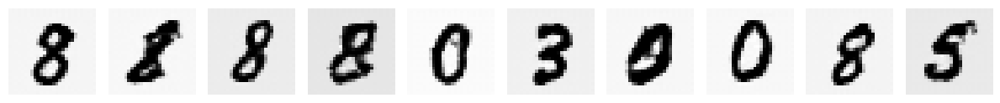

100%|██████████| 200/200 [2:36:21<00:00, 46.91s/it]


In [10]:
train(epochs=200, plt_frq=20, BATCH_SIZE=128)

In [11]:
# creating FNN GAN
adam=Adam(learning_rate=0.0002, beta_1=0.5)
def create_discriminator():
    discriminator= Sequential()
    discriminator.add(InputLayer(784,))
    discriminator.add(Dense(1024))
    discriminator.add(Activation(LeakyReLU(alpha=0.2)))
    discriminator.add(Dropout(.3))
    discriminator.add(Dense(512))
    discriminator.add(Activation(LeakyReLU(alpha=0.2)))
    discriminator.add(Dropout(.3))
    discriminator.add(Dense(256))
    discriminator.add(Activation(LeakyReLU(alpha=0.2)))
    discriminator.add(Dense(1,activation='sigmoid'))
    discriminator.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    return discriminator
discriminator=create_discriminator()
discriminator.summary()



def create_generator():

    generator= Sequential()
    generator.add(InputLayer((gchannels,)))
    generator.add(Dense(256))
    generator.add(Activation(LeakyReLU(alpha=0.2)))
    generator.add(Dense(512))
    generator.add(Activation(LeakyReLU(alpha=0.2)))
    generator.add(Dense(1024))
    generator.add(Activation(LeakyReLU(alpha=0.2)))
    generator.add(Dense(784,activation='tanh'))

    generator.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    return generator
generator=create_generator()
generator.summary()



Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 1024)              803840    
                                                                 
 activation_6 (Activation)   (None, 1024)              0         
                                                                 
 dropout_2 (Dropout)         (None, 1024)              0         
                                                                 
 dense_9 (Dense)             (None, 512)               524800    
                                                                 
 activation_7 (Activation)   (None, 512)               0         
                                                                 
 dropout_3 (Dropout)         (None, 512)               0         
                                                                 
 dense_10 (Dense)            (None, 256)              

In [12]:
gan=create_gan(discriminator,generator)

Epochs: 200
Batch size: 128
Batches per epoch: 546


  0%|          | 0/200 [00:00<?, ?it/s]

--------------- Epoch 1 ---------------
1/1 [==============================] - 0s 56ms/step


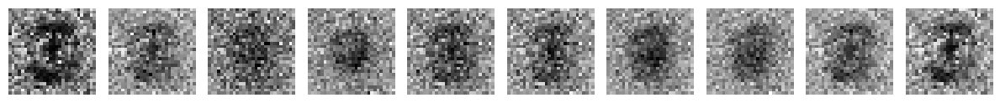

  0%|          | 1/200 [00:43<2:25:52, 43.98s/it]

4/4 [==============================] - 0s 2ms/step


  1%|          | 2/200 [01:25<2:19:24, 42.25s/it]

4/4 [==============================] - 0s 2ms/step


  2%|▏         | 3/200 [02:05<2:16:04, 41.45s/it]

4/4 [==============================] - 0s 2ms/step


  2%|▏         | 4/200 [02:47<2:16:43, 41.85s/it]

4/4 [==============================] - 0s 2ms/step


  2%|▎         | 5/200 [03:28<2:14:19, 41.33s/it]

4/4 [==============================] - 0s 2ms/step


  3%|▎         | 6/200 [04:10<2:14:11, 41.50s/it]

4/4 [==============================] - 0s 3ms/step


  4%|▎         | 7/200 [04:52<2:14:01, 41.66s/it]

4/4 [==============================] - 0s 2ms/step


  4%|▍         | 8/200 [05:34<2:13:38, 41.76s/it]

4/4 [==============================] - 0s 2ms/step


  4%|▍         | 9/200 [06:15<2:12:24, 41.60s/it]

4/4 [==============================] - 0s 2ms/step


  5%|▌         | 10/200 [06:57<2:11:45, 41.61s/it]

4/4 [==============================] - 0s 2ms/step


  6%|▌         | 11/200 [07:38<2:10:29, 41.43s/it]

4/4 [==============================] - 0s 2ms/step


  6%|▌         | 12/200 [08:20<2:10:17, 41.58s/it]

4/4 [==============================] - 0s 2ms/step


  6%|▋         | 13/200 [09:01<2:09:12, 41.46s/it]

4/4 [==============================] - 0s 2ms/step


  7%|▋         | 14/200 [09:43<2:09:27, 41.76s/it]

4/4 [==============================] - 0s 2ms/step


  8%|▊         | 15/200 [10:25<2:08:56, 41.82s/it]

4/4 [==============================] - 0s 2ms/step


  8%|▊         | 16/200 [11:07<2:08:41, 41.97s/it]

4/4 [==============================] - 0s 2ms/step


  8%|▊         | 17/200 [11:49<2:07:43, 41.88s/it]

4/4 [==============================] - 0s 2ms/step


  9%|▉         | 18/200 [12:30<2:06:08, 41.59s/it]

4/4 [==============================] - 0s 2ms/step


 10%|▉         | 19/200 [13:12<2:05:38, 41.65s/it]

--------------- Epoch 20 ---------------
1/1 [==============================] - 0s 17ms/step


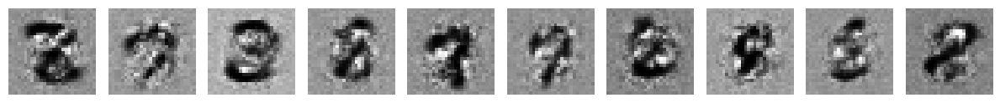

 10%|█         | 20/200 [13:53<2:04:31, 41.51s/it]

4/4 [==============================] - 0s 2ms/step


 10%|█         | 21/200 [14:35<2:04:21, 41.68s/it]

4/4 [==============================] - 0s 2ms/step


 11%|█         | 22/200 [15:16<2:03:25, 41.61s/it]

4/4 [==============================] - 0s 2ms/step


 12%|█▏        | 23/200 [15:59<2:03:15, 41.78s/it]

4/4 [==============================] - 0s 2ms/step


 12%|█▏        | 24/200 [16:40<2:01:57, 41.58s/it]

4/4 [==============================] - 0s 2ms/step


 12%|█▎        | 25/200 [17:22<2:02:01, 41.84s/it]

4/4 [==============================] - 0s 2ms/step


 13%|█▎        | 26/200 [18:04<2:00:54, 41.69s/it]

4/4 [==============================] - 0s 2ms/step


 14%|█▎        | 27/200 [18:46<2:00:53, 41.93s/it]

4/4 [==============================] - 0s 2ms/step


 14%|█▍        | 28/200 [19:27<1:59:42, 41.76s/it]

4/4 [==============================] - 0s 2ms/step


 14%|█▍        | 29/200 [20:10<1:59:55, 42.08s/it]

4/4 [==============================] - 0s 2ms/step


 15%|█▌        | 30/200 [20:52<1:59:21, 42.12s/it]

4/4 [==============================] - 0s 2ms/step


 16%|█▌        | 31/200 [21:35<1:59:23, 42.39s/it]

4/4 [==============================] - 0s 2ms/step


 16%|█▌        | 32/200 [22:18<1:58:47, 42.43s/it]

4/4 [==============================] - 0s 2ms/step


 16%|█▋        | 33/200 [23:01<1:58:12, 42.47s/it]

4/4 [==============================] - 0s 2ms/step


 17%|█▋        | 34/200 [23:43<1:57:50, 42.60s/it]

4/4 [==============================] - 0s 2ms/step


 18%|█▊        | 35/200 [24:25<1:55:56, 42.16s/it]

4/4 [==============================] - 0s 2ms/step


 18%|█▊        | 36/200 [25:08<1:56:28, 42.61s/it]

4/4 [==============================] - 0s 2ms/step


 18%|█▊        | 37/200 [25:51<1:55:46, 42.61s/it]

4/4 [==============================] - 0s 2ms/step


 19%|█▉        | 38/200 [26:33<1:54:59, 42.59s/it]

4/4 [==============================] - 0s 3ms/step


 20%|█▉        | 39/200 [27:16<1:54:09, 42.55s/it]

--------------- Epoch 40 ---------------
1/1 [==============================] - 0s 19ms/step


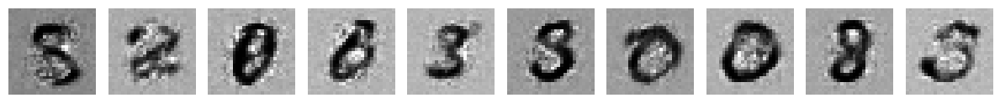

 20%|██        | 40/200 [28:00<1:54:51, 43.07s/it]

4/4 [==============================] - 0s 2ms/step


 20%|██        | 41/200 [28:43<1:53:40, 42.90s/it]

4/4 [==============================] - 0s 2ms/step


 21%|██        | 42/200 [29:25<1:52:53, 42.87s/it]

4/4 [==============================] - 0s 3ms/step


 22%|██▏       | 43/200 [30:10<1:53:11, 43.26s/it]

4/4 [==============================] - 0s 2ms/step


 22%|██▏       | 44/200 [30:55<1:54:18, 43.96s/it]

4/4 [==============================] - 0s 2ms/step


 22%|██▎       | 45/200 [31:40<1:53:53, 44.09s/it]

4/4 [==============================] - 0s 2ms/step


 23%|██▎       | 46/200 [32:24<1:53:43, 44.31s/it]

4/4 [==============================] - 0s 2ms/step


 24%|██▎       | 47/200 [33:09<1:53:21, 44.45s/it]

4/4 [==============================] - 0s 2ms/step


 24%|██▍       | 48/200 [33:53<1:52:15, 44.31s/it]

4/4 [==============================] - 0s 2ms/step


 24%|██▍       | 49/200 [34:38<1:52:02, 44.52s/it]

4/4 [==============================] - 0s 2ms/step


 25%|██▌       | 50/200 [35:23<1:51:15, 44.50s/it]

4/4 [==============================] - 0s 2ms/step


 26%|██▌       | 51/200 [36:08<1:51:11, 44.78s/it]

4/4 [==============================] - 0s 2ms/step


 26%|██▌       | 52/200 [36:53<1:50:11, 44.67s/it]

4/4 [==============================] - 0s 2ms/step


 26%|██▋       | 53/200 [37:38<1:49:44, 44.80s/it]

4/4 [==============================] - 0s 2ms/step


 27%|██▋       | 54/200 [38:21<1:48:15, 44.49s/it]

4/4 [==============================] - 0s 2ms/step


 28%|██▊       | 55/200 [39:07<1:48:00, 44.69s/it]

4/4 [==============================] - 0s 2ms/step


 28%|██▊       | 56/200 [39:49<1:45:44, 44.06s/it]

4/4 [==============================] - 0s 2ms/step


 28%|██▊       | 57/200 [40:32<1:44:23, 43.80s/it]

4/4 [==============================] - 0s 2ms/step


 29%|██▉       | 58/200 [41:15<1:42:34, 43.34s/it]

4/4 [==============================] - 0s 2ms/step


 30%|██▉       | 59/200 [41:57<1:41:31, 43.20s/it]

--------------- Epoch 60 ---------------
1/1 [==============================] - 0s 17ms/step


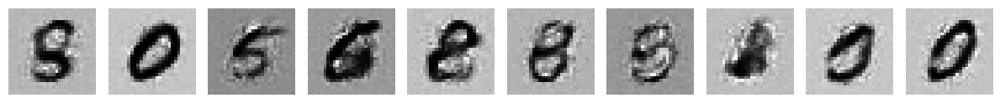

 30%|███       | 60/200 [42:39<1:39:21, 42.58s/it]

4/4 [==============================] - 0s 2ms/step


 30%|███       | 61/200 [43:20<1:37:29, 42.08s/it]

4/4 [==============================] - 0s 2ms/step


 31%|███       | 62/200 [44:00<1:35:55, 41.71s/it]

4/4 [==============================] - 0s 2ms/step


 32%|███▏      | 63/200 [44:41<1:34:27, 41.37s/it]

4/4 [==============================] - 0s 2ms/step


 32%|███▏      | 64/200 [45:22<1:33:28, 41.24s/it]

4/4 [==============================] - 0s 2ms/step


 32%|███▎      | 65/200 [46:03<1:32:28, 41.10s/it]

4/4 [==============================] - 0s 2ms/step


 33%|███▎      | 66/200 [46:44<1:31:45, 41.09s/it]

4/4 [==============================] - 0s 2ms/step


 34%|███▎      | 67/200 [47:24<1:30:32, 40.85s/it]

4/4 [==============================] - 0s 2ms/step


 34%|███▍      | 68/200 [48:05<1:29:58, 40.90s/it]

4/4 [==============================] - 0s 2ms/step


 34%|███▍      | 69/200 [48:45<1:28:49, 40.68s/it]

4/4 [==============================] - 0s 2ms/step


 35%|███▌      | 70/200 [49:26<1:28:24, 40.81s/it]

4/4 [==============================] - 0s 2ms/step


 36%|███▌      | 71/200 [50:07<1:27:28, 40.69s/it]

4/4 [==============================] - 0s 2ms/step


 36%|███▌      | 72/200 [50:48<1:27:11, 40.87s/it]

4/4 [==============================] - 0s 2ms/step


 36%|███▋      | 73/200 [51:28<1:26:08, 40.70s/it]

4/4 [==============================] - 0s 2ms/step


 37%|███▋      | 74/200 [52:10<1:25:55, 40.91s/it]

4/4 [==============================] - 0s 2ms/step


 38%|███▊      | 75/200 [52:50<1:24:51, 40.73s/it]

4/4 [==============================] - 0s 2ms/step


 38%|███▊      | 76/200 [53:31<1:24:22, 40.83s/it]

4/4 [==============================] - 0s 2ms/step


 38%|███▊      | 77/200 [54:11<1:23:13, 40.60s/it]

4/4 [==============================] - 0s 2ms/step


 39%|███▉      | 78/200 [54:53<1:23:09, 40.90s/it]

4/4 [==============================] - 0s 2ms/step


 40%|███▉      | 79/200 [55:35<1:23:08, 41.23s/it]

--------------- Epoch 80 ---------------
1/1 [==============================] - 0s 17ms/step


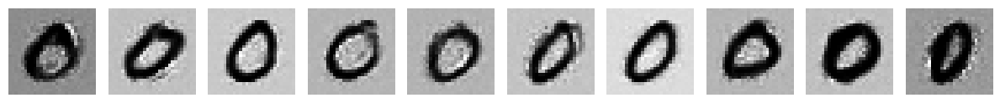

 40%|████      | 80/200 [56:18<1:23:31, 41.76s/it]

4/4 [==============================] - 0s 2ms/step


 40%|████      | 81/200 [56:59<1:22:45, 41.73s/it]

4/4 [==============================] - 0s 2ms/step


 41%|████      | 82/200 [57:41<1:21:54, 41.65s/it]

4/4 [==============================] - 0s 2ms/step


 42%|████▏     | 83/200 [58:24<1:22:00, 42.05s/it]

4/4 [==============================] - 0s 2ms/step


 42%|████▏     | 84/200 [59:06<1:21:06, 41.95s/it]

4/4 [==============================] - 0s 2ms/step


 42%|████▎     | 85/200 [59:48<1:20:32, 42.03s/it]

4/4 [==============================] - 0s 2ms/step


 43%|████▎     | 86/200 [1:00:29<1:19:22, 41.77s/it]

4/4 [==============================] - 0s 2ms/step


 44%|████▎     | 87/200 [1:01:11<1:19:00, 41.95s/it]

4/4 [==============================] - 0s 2ms/step


 44%|████▍     | 88/200 [1:01:53<1:18:08, 41.86s/it]

4/4 [==============================] - 0s 2ms/step


 44%|████▍     | 89/200 [1:02:36<1:18:11, 42.27s/it]

4/4 [==============================] - 0s 2ms/step


 45%|████▌     | 90/200 [1:03:19<1:17:41, 42.37s/it]

4/4 [==============================] - 0s 2ms/step


 46%|████▌     | 91/200 [1:04:02<1:17:40, 42.75s/it]

4/4 [==============================] - 0s 2ms/step


 46%|████▌     | 92/200 [1:04:45<1:16:36, 42.56s/it]

4/4 [==============================] - 0s 2ms/step


 46%|████▋     | 93/200 [1:05:28<1:16:14, 42.76s/it]

4/4 [==============================] - 0s 2ms/step


 47%|████▋     | 94/200 [1:06:10<1:15:15, 42.60s/it]

4/4 [==============================] - 0s 2ms/step


 48%|████▊     | 95/200 [1:06:53<1:14:43, 42.70s/it]

4/4 [==============================] - 0s 2ms/step


 48%|████▊     | 96/200 [1:07:34<1:13:16, 42.27s/it]

4/4 [==============================] - 0s 2ms/step


 48%|████▊     | 97/200 [1:08:17<1:12:36, 42.29s/it]

4/4 [==============================] - 0s 2ms/step


 49%|████▉     | 98/200 [1:08:57<1:11:05, 41.82s/it]

4/4 [==============================] - 0s 2ms/step


 50%|████▉     | 99/200 [1:09:39<1:10:28, 41.87s/it]

--------------- Epoch 100 ---------------
1/1 [==============================] - 0s 17ms/step


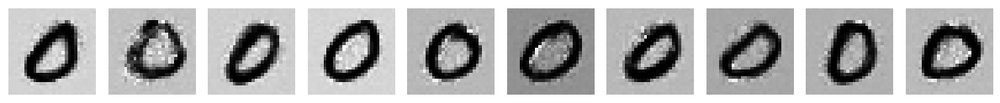

 50%|█████     | 100/200 [1:10:21<1:09:41, 41.82s/it]

4/4 [==============================] - 0s 2ms/step


 50%|█████     | 101/200 [1:11:02<1:08:49, 41.71s/it]

4/4 [==============================] - 0s 2ms/step


 51%|█████     | 102/200 [1:11:45<1:08:34, 41.98s/it]

4/4 [==============================] - 0s 2ms/step


 52%|█████▏    | 103/200 [1:12:27<1:07:43, 41.89s/it]

4/4 [==============================] - 0s 2ms/step


 52%|█████▏    | 104/200 [1:13:11<1:08:00, 42.50s/it]

4/4 [==============================] - 0s 2ms/step


 52%|█████▎    | 105/200 [1:13:55<1:08:19, 43.15s/it]

4/4 [==============================] - 0s 2ms/step


 53%|█████▎    | 106/200 [1:14:40<1:08:15, 43.57s/it]

4/4 [==============================] - 0s 2ms/step


 54%|█████▎    | 107/200 [1:15:23<1:07:20, 43.45s/it]

4/4 [==============================] - 0s 2ms/step


 54%|█████▍    | 108/200 [1:16:05<1:06:06, 43.12s/it]

4/4 [==============================] - 0s 2ms/step


 55%|█████▍    | 109/200 [1:16:47<1:04:43, 42.68s/it]

4/4 [==============================] - 0s 2ms/step


 55%|█████▌    | 110/200 [1:17:30<1:03:58, 42.65s/it]

4/4 [==============================] - 0s 2ms/step


 56%|█████▌    | 111/200 [1:18:11<1:02:38, 42.23s/it]

4/4 [==============================] - 0s 2ms/step


 56%|█████▌    | 112/200 [1:18:54<1:02:10, 42.39s/it]

4/4 [==============================] - 0s 2ms/step


 56%|█████▋    | 113/200 [1:19:35<1:01:03, 42.11s/it]

4/4 [==============================] - 0s 2ms/step


 57%|█████▋    | 114/200 [1:20:18<1:00:38, 42.31s/it]

4/4 [==============================] - 0s 2ms/step


 57%|█████▊    | 115/200 [1:20:59<59:37, 42.09s/it]  

4/4 [==============================] - 0s 2ms/step


 58%|█████▊    | 116/200 [1:21:42<59:11, 42.28s/it]

4/4 [==============================] - 0s 2ms/step


 58%|█████▊    | 117/200 [1:22:25<58:35, 42.35s/it]

4/4 [==============================] - 0s 2ms/step


 59%|█████▉    | 118/200 [1:23:08<58:06, 42.52s/it]

4/4 [==============================] - 0s 2ms/step


 60%|█████▉    | 119/200 [1:23:51<57:35, 42.67s/it]

--------------- Epoch 120 ---------------
1/1 [==============================] - 0s 19ms/step


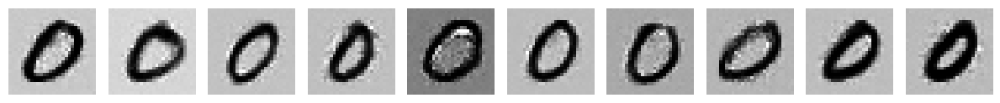

 60%|██████    | 120/200 [1:24:33<56:45, 42.57s/it]

4/4 [==============================] - 0s 2ms/step


 60%|██████    | 121/200 [1:25:16<56:08, 42.64s/it]

4/4 [==============================] - 0s 2ms/step


 61%|██████    | 122/200 [1:25:57<55:02, 42.35s/it]

4/4 [==============================] - 0s 2ms/step


 62%|██████▏   | 123/200 [1:26:41<54:39, 42.59s/it]

4/4 [==============================] - 0s 2ms/step


 62%|██████▏   | 124/200 [1:27:23<54:00, 42.64s/it]

4/4 [==============================] - 0s 2ms/step


 62%|██████▎   | 125/200 [1:28:06<53:23, 42.71s/it]

4/4 [==============================] - 0s 2ms/step


 63%|██████▎   | 126/200 [1:28:48<52:23, 42.49s/it]

4/4 [==============================] - 0s 2ms/step


 64%|██████▎   | 127/200 [1:29:31<51:49, 42.59s/it]

4/4 [==============================] - 0s 2ms/step


 64%|██████▍   | 128/200 [1:30:15<51:27, 42.89s/it]

4/4 [==============================] - 0s 2ms/step


 64%|██████▍   | 129/200 [1:30:58<50:48, 42.93s/it]

4/4 [==============================] - 0s 2ms/step


 65%|██████▌   | 130/200 [1:31:39<49:42, 42.60s/it]

4/4 [==============================] - 0s 2ms/step


 66%|██████▌   | 131/200 [1:32:23<49:13, 42.80s/it]

4/4 [==============================] - 0s 2ms/step


 66%|██████▌   | 132/200 [1:33:05<48:12, 42.54s/it]

4/4 [==============================] - 0s 2ms/step


 66%|██████▋   | 133/200 [1:33:48<47:47, 42.79s/it]

4/4 [==============================] - 0s 3ms/step


 67%|██████▋   | 134/200 [1:34:31<47:04, 42.79s/it]

4/4 [==============================] - 0s 2ms/step


 68%|██████▊   | 135/200 [1:35:14<46:29, 42.92s/it]

4/4 [==============================] - 0s 2ms/step


 68%|██████▊   | 136/200 [1:35:57<45:57, 43.09s/it]

4/4 [==============================] - 0s 2ms/step


 68%|██████▊   | 137/200 [1:36:40<45:05, 42.95s/it]

4/4 [==============================] - 0s 2ms/step


 69%|██████▉   | 138/200 [1:37:24<44:42, 43.26s/it]

4/4 [==============================] - 0s 2ms/step


 70%|██████▉   | 139/200 [1:38:07<43:58, 43.25s/it]

--------------- Epoch 140 ---------------
1/1 [==============================] - 0s 18ms/step


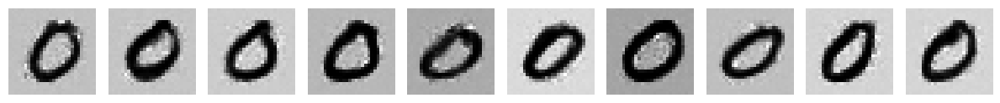

 70%|███████   | 140/200 [1:38:52<43:36, 43.60s/it]

4/4 [==============================] - 0s 2ms/step


 70%|███████   | 141/200 [1:39:35<42:49, 43.55s/it]

4/4 [==============================] - 0s 2ms/step


 71%|███████   | 142/200 [1:40:19<42:17, 43.75s/it]

4/4 [==============================] - 0s 2ms/step


 72%|███████▏  | 143/200 [1:41:03<41:29, 43.67s/it]

4/4 [==============================] - 0s 2ms/step


 72%|███████▏  | 144/200 [1:41:48<41:07, 44.07s/it]

4/4 [==============================] - 0s 2ms/step


 72%|███████▎  | 145/200 [1:42:32<40:19, 43.99s/it]

4/4 [==============================] - 0s 2ms/step


 73%|███████▎  | 146/200 [1:43:16<39:46, 44.20s/it]

4/4 [==============================] - 0s 2ms/step


 74%|███████▎  | 147/200 [1:44:00<38:59, 44.13s/it]

4/4 [==============================] - 0s 2ms/step


 74%|███████▍  | 148/200 [1:44:45<38:30, 44.43s/it]

4/4 [==============================] - 0s 2ms/step


 74%|███████▍  | 149/200 [1:45:30<37:46, 44.44s/it]

4/4 [==============================] - 0s 2ms/step


 75%|███████▌  | 150/200 [1:46:14<36:52, 44.26s/it]

4/4 [==============================] - 0s 2ms/step


 76%|███████▌  | 151/200 [1:46:58<36:14, 44.38s/it]

4/4 [==============================] - 0s 2ms/step


 76%|███████▌  | 152/200 [1:47:42<35:13, 44.04s/it]

4/4 [==============================] - 0s 2ms/step


 76%|███████▋  | 153/200 [1:48:26<34:32, 44.10s/it]

4/4 [==============================] - 0s 2ms/step


 77%|███████▋  | 154/200 [1:49:09<33:37, 43.85s/it]

4/4 [==============================] - 0s 2ms/step


 78%|███████▊  | 155/200 [1:49:53<32:58, 43.97s/it]

4/4 [==============================] - 0s 2ms/step


 78%|███████▊  | 156/200 [1:50:37<32:08, 43.83s/it]

4/4 [==============================] - 0s 2ms/step


 78%|███████▊  | 157/200 [1:51:21<31:30, 43.96s/it]

4/4 [==============================] - 0s 2ms/step


 79%|███████▉  | 158/200 [1:52:04<30:32, 43.63s/it]

4/4 [==============================] - 0s 2ms/step


 80%|███████▉  | 159/200 [1:52:48<29:52, 43.72s/it]

--------------- Epoch 160 ---------------
1/1 [==============================] - 0s 17ms/step


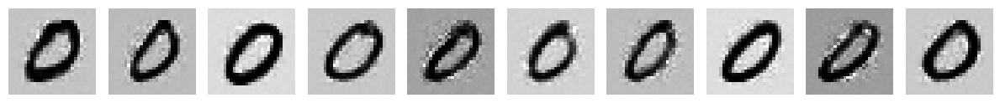

 80%|████████  | 160/200 [1:53:32<29:18, 43.96s/it]

4/4 [==============================] - 0s 2ms/step


 80%|████████  | 161/200 [1:54:18<28:53, 44.44s/it]

4/4 [==============================] - 0s 2ms/step


 81%|████████  | 162/200 [1:55:02<27:58, 44.18s/it]

4/4 [==============================] - 0s 3ms/step


 82%|████████▏ | 163/200 [1:55:47<27:28, 44.57s/it]

4/4 [==============================] - 0s 2ms/step


 82%|████████▏ | 164/200 [1:56:32<26:46, 44.63s/it]

4/4 [==============================] - 0s 2ms/step


 82%|████████▎ | 165/200 [1:57:17<26:09, 44.83s/it]

4/4 [==============================] - 0s 2ms/step


 83%|████████▎ | 166/200 [1:58:02<25:19, 44.71s/it]

4/4 [==============================] - 0s 2ms/step


 84%|████████▎ | 167/200 [1:58:46<24:30, 44.57s/it]

4/4 [==============================] - 0s 2ms/step


 84%|████████▍ | 168/200 [1:59:31<23:47, 44.62s/it]

4/4 [==============================] - 0s 2ms/step


 84%|████████▍ | 169/200 [2:00:15<22:59, 44.51s/it]

4/4 [==============================] - 0s 2ms/step


 85%|████████▌ | 170/200 [2:01:00<22:21, 44.71s/it]

4/4 [==============================] - 0s 2ms/step


 86%|████████▌ | 171/200 [2:01:44<21:32, 44.57s/it]

4/4 [==============================] - 0s 2ms/step


 86%|████████▌ | 172/200 [2:02:31<21:04, 45.16s/it]

4/4 [==============================] - 0s 2ms/step


 86%|████████▋ | 173/200 [2:03:18<20:39, 45.89s/it]

4/4 [==============================] - 0s 2ms/step


 87%|████████▋ | 174/200 [2:04:05<20:00, 46.19s/it]

4/4 [==============================] - 0s 2ms/step


 88%|████████▊ | 175/200 [2:04:51<19:13, 46.14s/it]

4/4 [==============================] - 0s 3ms/step


 88%|████████▊ | 176/200 [2:05:38<18:31, 46.31s/it]

4/4 [==============================] - 0s 2ms/step


 88%|████████▊ | 177/200 [2:06:22<17:28, 45.60s/it]

4/4 [==============================] - 0s 2ms/step


 89%|████████▉ | 178/200 [2:07:07<16:38, 45.40s/it]

4/4 [==============================] - 0s 2ms/step


 90%|████████▉ | 179/200 [2:07:50<15:41, 44.82s/it]

--------------- Epoch 180 ---------------
1/1 [==============================] - 0s 41ms/step


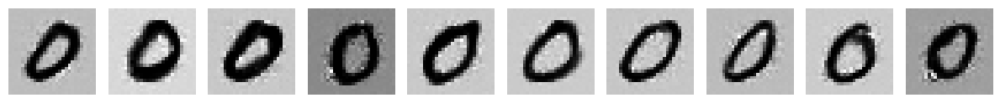

 90%|█████████ | 180/200 [2:08:36<14:59, 44.99s/it]

4/4 [==============================] - 0s 2ms/step


 90%|█████████ | 181/200 [2:09:20<14:08, 44.64s/it]

4/4 [==============================] - 0s 2ms/step


 91%|█████████ | 182/200 [2:10:04<13:22, 44.56s/it]

4/4 [==============================] - 0s 2ms/step


 92%|█████████▏| 183/200 [2:10:48<12:34, 44.36s/it]

4/4 [==============================] - 0s 2ms/step


 92%|█████████▏| 184/200 [2:11:32<11:48, 44.27s/it]

4/4 [==============================] - 0s 2ms/step


 92%|█████████▎| 185/200 [2:12:16<11:04, 44.32s/it]

4/4 [==============================] - 0s 2ms/step


 93%|█████████▎| 186/200 [2:13:00<10:19, 44.27s/it]

4/4 [==============================] - 0s 2ms/step


 94%|█████████▎| 187/200 [2:13:45<09:37, 44.42s/it]

4/4 [==============================] - 0s 2ms/step


 94%|█████████▍| 188/200 [2:14:28<08:48, 44.04s/it]

4/4 [==============================] - 0s 2ms/step


 94%|█████████▍| 189/200 [2:15:14<08:08, 44.38s/it]

4/4 [==============================] - 0s 2ms/step


 95%|█████████▌| 190/200 [2:15:58<07:23, 44.34s/it]

4/4 [==============================] - 0s 2ms/step


 96%|█████████▌| 191/200 [2:16:43<06:40, 44.45s/it]

4/4 [==============================] - 0s 2ms/step


 96%|█████████▌| 192/200 [2:17:27<05:55, 44.39s/it]

4/4 [==============================] - 0s 2ms/step


 96%|█████████▋| 193/200 [2:18:12<05:12, 44.57s/it]

4/4 [==============================] - 0s 2ms/step


 97%|█████████▋| 194/200 [2:18:56<04:26, 44.41s/it]

4/4 [==============================] - 0s 2ms/step


 98%|█████████▊| 195/200 [2:19:40<03:41, 44.35s/it]

4/4 [==============================] - 0s 2ms/step


 98%|█████████▊| 196/200 [2:20:24<02:56, 44.22s/it]

4/4 [==============================] - 0s 2ms/step


 98%|█████████▊| 197/200 [2:21:10<02:13, 44.65s/it]

4/4 [==============================] - 0s 2ms/step


 99%|█████████▉| 198/200 [2:21:53<01:28, 44.36s/it]

4/4 [==============================] - 0s 2ms/step


100%|█████████▉| 199/200 [2:22:38<00:44, 44.51s/it]

--------------- Epoch 200 ---------------
1/1 [==============================] - 0s 17ms/step


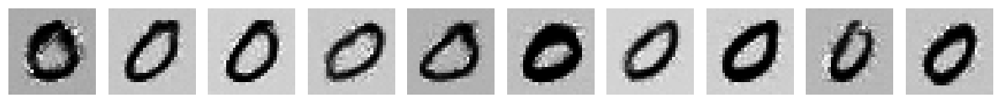

100%|██████████| 200/200 [2:23:22<00:00, 43.01s/it]


In [13]:
#flattening input for FNN
x = x.reshape(70000, 784)
train(epochs=200, plt_frq=20, BATCH_SIZE=128)